<center>
    <p style="text-align:center">
    <img alt="arize logo" src="https://storage.googleapis.com/arize-assets/arize-logo-white.jpg" width="300"/>
        <br>
        <a href="https://docs.arize.com/arize/">Docs</a>
        |
        <a href="https://github.com/Arize-ai/client_python">GitHub</a>
        |
        <a href="https://arize-ai.slack.com/join/shared_invite/zt-11t1vbu4x-xkBIHmOREQnYnYDH1GDfCg">Community</a>
    </p>
</center>

<center><h1>OpenAI Function Calling</h1></center>

# Overview

This example is based on the [Open AI function calling docs](https://platform.openai.com/docs/guides/function-calling). We use the same example from the docs, instrumenting the Open AI chat completion calls so that the function calling traces can be viewed in the Arize platform and used in the Arize Prompt Playground.

# Installations & Imports

In [ ]:
!pip install -qq opentelemetry-api opentelemetry-sdk opentelemetry-exporter-otlp openai openinference-semantic-conventions openinference-instrumentation-openai arize-otel

In [ ]:
import json
import os
import random
from getpass import getpass

import openai
from openai import OpenAI
from openinference.instrumentation.openai import OpenAIInstrumentor
from arize.otel import register

# Set Up API Keys and Register OTEL

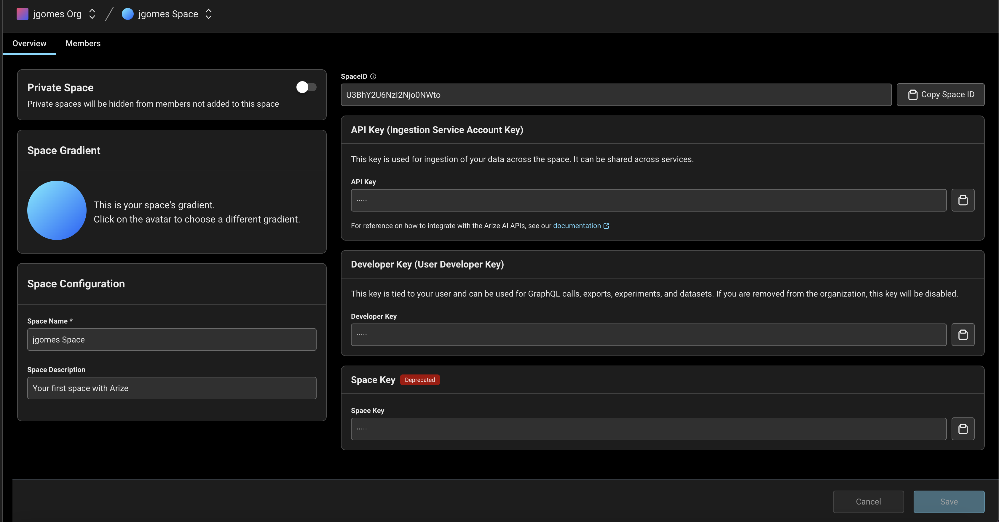

In [ ]:
SPACE_ID = globals().get("SPACE_ID") or getpass(
    "🔑 Enter your Arize Space ID: "
)
API_KEY = globals().get("API_KEY") or getpass("🔑 Enter your Arize API Key: ")
OPENAI_API_KEY = globals().get("OPENAI_API_KEY") or getpass(
    "🔑 Enter your OpenAI API key: "
)

os.environ["OPENAI_API_KEY"] = OPENAI_API_KEY

# Register OTEL

In [ ]:
# Setup OTEL via our convenience function.
tracer_provider = register(
    space_id=getpass("Enter your Arize Space ID: "),
    api_key=getpass("Enter your Arize API Key: "),
    project_name="function-calling-demo-open-ai-docs",
)

# Open AI Auto Instrumentation

In [ ]:
# Because we are using Open AI, we will use this along with our custom instrumentation
OpenAIInstrumentor().instrument(tracer_provider=tracer_provider)

# Define Callable Function

In [ ]:
# This is the function that we want the model to be able to call
def get_delivery_date(order_id: str) -> str:
    random.seed(order_id)
    delivery_date = random.randint(0, 30)
    return f"Oct {delivery_date}, 2025"

# Define Tools

In [ ]:
tools = [
    {
        "type": "function",
        "function": {
            "name": "get_delivery_date",
            "description": "Get the delivery date for a customer's order. Call this whenever you need to know the delivery date, for example when a customer asks 'Where is my package'",
            "parameters": {
                "type": "object",
                "properties": {
                    "order_id": {
                        "type": "string",
                        "description": "The customer's order ID.",
                    },
                },
                "required": ["order_id"],
                "additionalProperties": False,
            },
        },
    }
]

# LLM Chats with User to Get Order ID

In [ ]:
messages = [
    {
        "role": "system",
        "content": "You are a helpful customer support assistant. Use the supplied tools to assist the user.",
    },
    {
        "role": "user",
        "content": "Hi, can you tell me the delivery date for my order?",
    },
]

In [ ]:
response = openai.chat.completions.create(
    model="gpt-4o",
    messages=messages,
    tools=tools,
)
messages.append(
    {"role": "assistant", "content": response.choices[0].message.content}
)
for m in messages:
    print(m)

In [ ]:
messages.append({"role": "user", "content": "i think it is order_12345"})

# LLM Calls Tools Using Customer Order ID

In [ ]:
client = OpenAI()
tool_calls_response = client.chat.completions.create(
    model="gpt-4o", messages=messages, tools=tools
)
print(tool_calls_response)

In [ ]:
print(tool_calls_response.choices[0].message.tool_calls[0].function)

In [ ]:
# Extract the arguments for get_delivery_date
# Note this code assumes we have already determined that the model generated a function call. See below for a more production ready example that shows how to check if the model generated a function call
tool_call = tool_calls_response.choices[0].message.tool_calls[0]
print(f"tool_call: {tool_call}")
tool_call_dict = dict(tool_calls_response.choices[0].message.tool_calls[0])
print(f"tool_call_dict: {tool_call_dict}")
tool_call_dict["function"] = dict(tool_call_dict["function"])
print(f"tool_call_dict: {tool_call_dict}")
arguments = json.loads(tool_call.function.arguments)
print(f"arguments: {arguments}")

order_id = arguments.get("order_id")
print(f"order_id: {order_id}")

# Call the get_delivery_date function with the extracted order_id
delivery_date = get_delivery_date(order_id)
print(f"delivery_date: {delivery_date}")

# LLM Provides Function Call Response

In [ ]:
messages.append(
    {
        "role": tool_calls_response.choices[0].message.role,
        "tool_calls": [tool_call_dict],
    }
)

In [ ]:
messages

In [ ]:
# Create a message containing the result of the function call
function_call_result_message = {
    "role": "tool",
    "content": json.dumps(
        {"order_id": order_id, "delivery_date": delivery_date}
    ),
    "tool_call_id": tool_call.id,
}
print(function_call_result_message)
messages.append(function_call_result_message)

# LLM Uses Function Call Response to Reply to User Message

In [ ]:
messages

In [ ]:
# Call the OpenAI API's chat completions endpoint to send the tool call result back to the model
response = client.chat.completions.create(
    model="gpt-4o", messages=messages, tools=tools
)

# Print the response from the API. In this case it will typically contain a message such as "The delivery date for your order #12345 is xyz. Is there anything else I can help you with?"
print(response)

In [ ]:
messages.append(
    {"role": "assistant", "content": response.choices[0].message.content}
)

In [ ]:
messages

# View Traces

View traces to debug chat history and ensure the expected function call was made with the appropriate parameters.

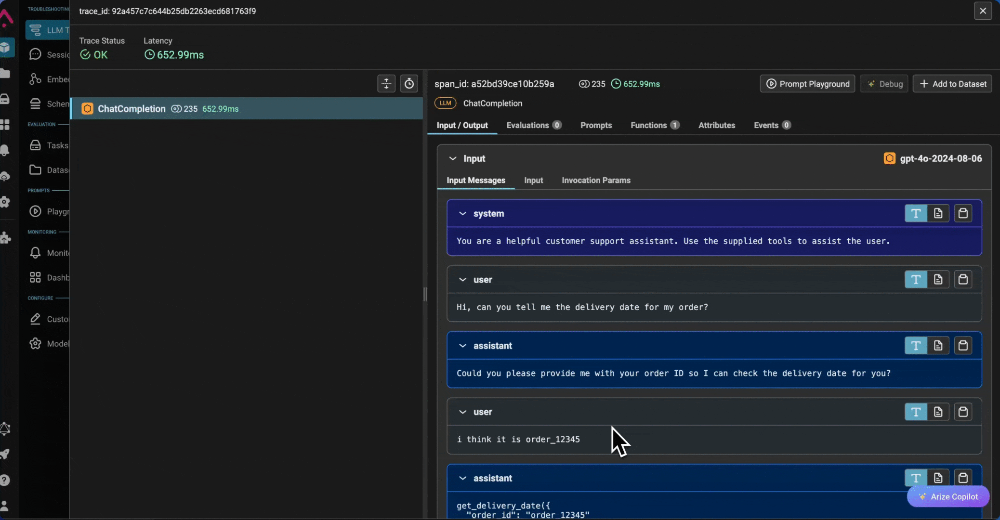

# Replay Chat in Prompt Playground

Load chat in the prompt playground to experiment with different function definitions, LLM model parameters and chat messages.

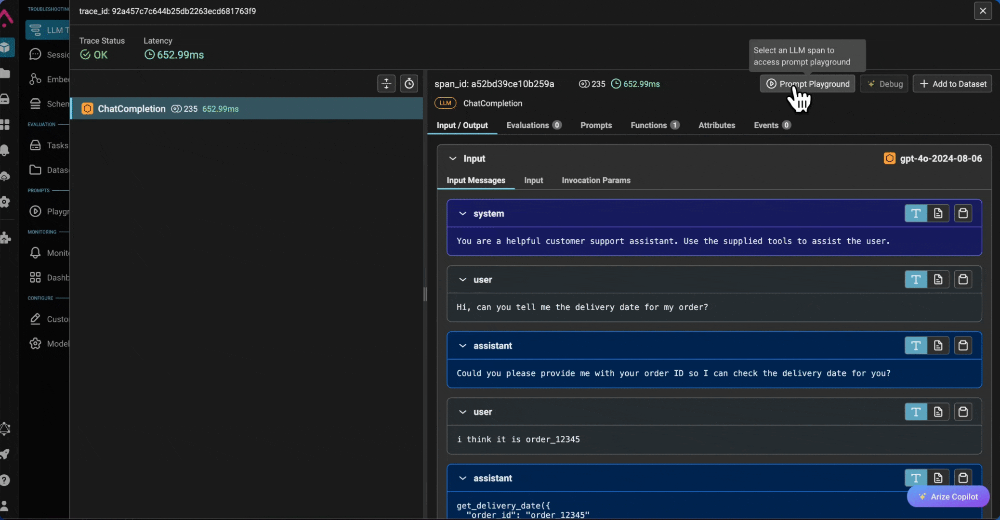

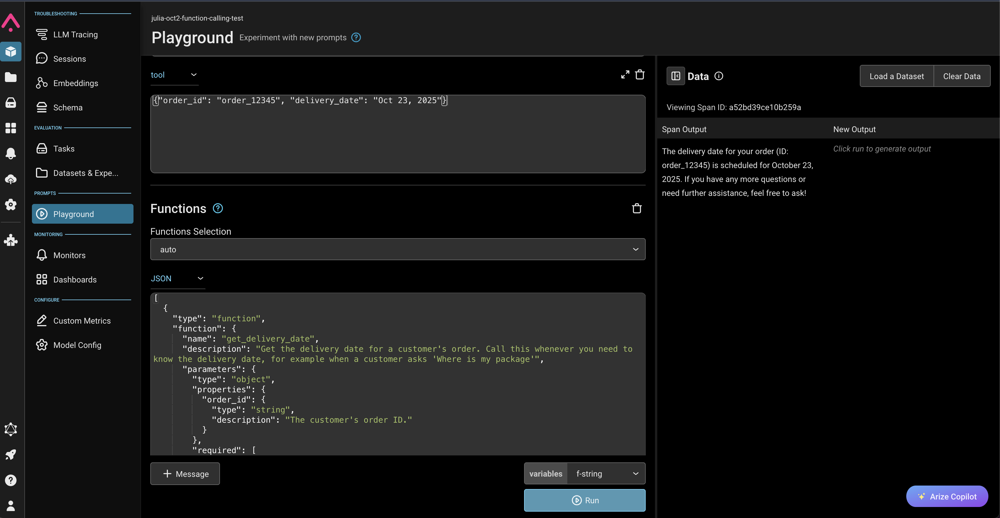